# **TP N°2 : Filtrage spatial et fréquentiel des images numériques**

# **Partie I : Filtrage spatial** 

## **Manipulation 1 : Réduction du bruit**





In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import cmath
import os
from skimage.util import random_noise


**I-lecture et affichage de l'image** 

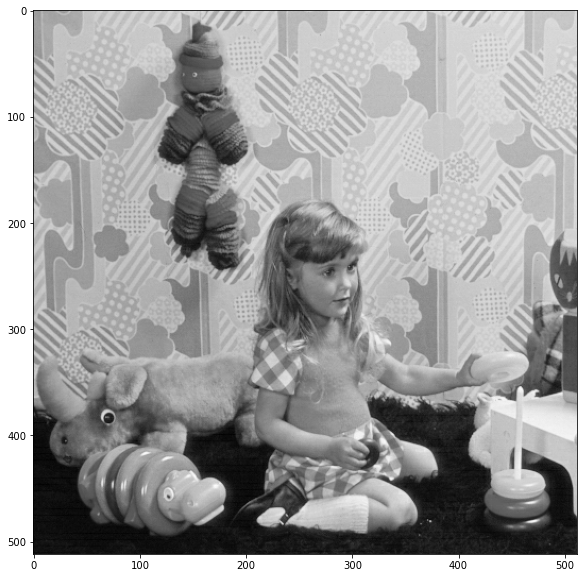

In [ ]:
img = cv.imread("C:/Users/User/Documents/Etudes/TIM/images/isabelle.bmp",0)
plt.figure(figsize=(10,10))
plt.imshow(img, cmap='gray')

**II- L'ajout de bruit gaussien** 

Gaussienne avec un écart-type = 0.03 et une moyenne = 0

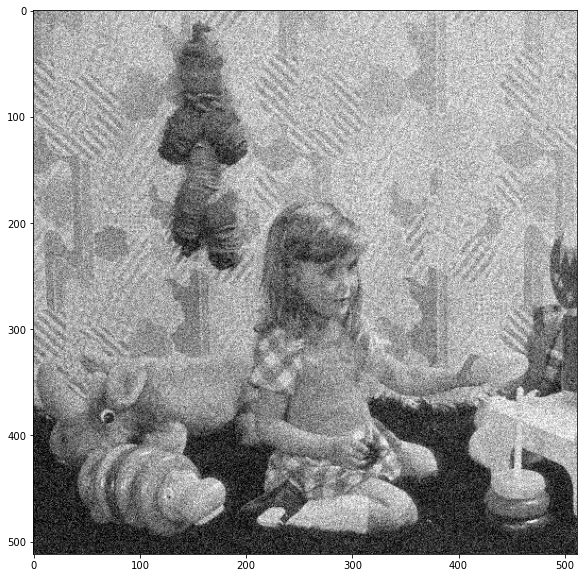

In [ ]:
noisy_img = random_noise(img, mode = 'gaussian', var = 0.01, mean = 0 )
plt.figure(figsize=(10,10))
plt.imshow(noisy_img, cmap='gray')

**A. Filtre moyenneur** 


**1-Filtrage moyenneur 3x3** 

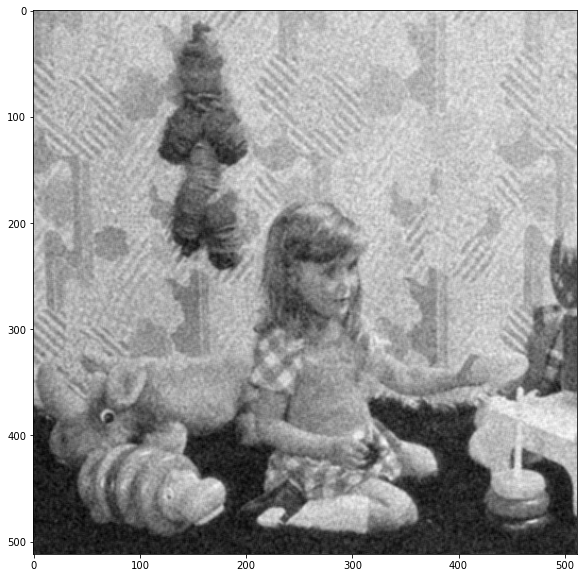

In [ ]:
blur = cv.blur(noisy_img, ksize = (3,3))
plt.figure(figsize=(10,10))
plt.imshow(blur, cmap = 'gray')

In [ ]:
blur.shape

(512, 512)

Commentaire: l'image est plus lisse mais elle reste non claire 

La taille de l'image est 512x512 elle n'a pas changée

Les bords ont été traité en ajoutant des pixels en plus avec des valeurs symétriques aux pixels de bords de l'image. 

**Changement de méthode les pixels ajoutés ont une valeurs nulles:** 

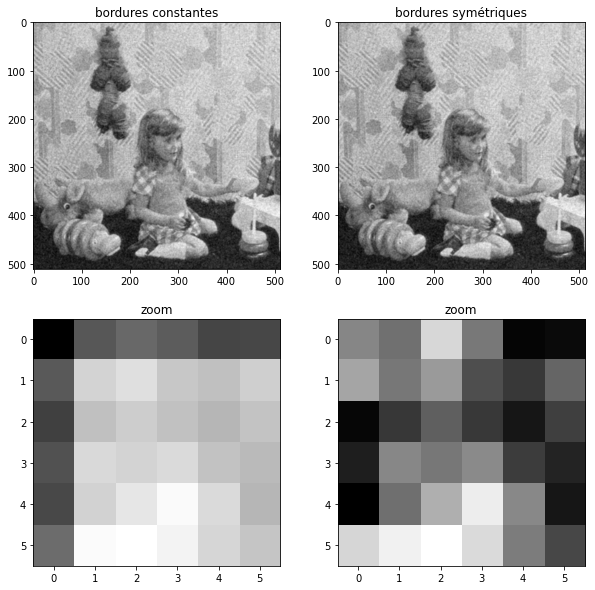

In [ ]:
#création et affichage de l'image avec une autre méthode de traitement de bordure
blur_border_type = cv.blur(noisy_img, ksize = (3,3), borderType =cv.BORDER_CONSTANT ) 
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
plt.title("bordures constantes")
plt.imshow(blur_border_type, cmap='gray')

#affichage de l'image avec les bordures symétriques
plt.subplot(2,2,2)
plt.title("bordures symétriques")
plt.imshow(blur,cmap="gray")

#zoomer sur les deux images 
plt.subplot(2,2,3)
plt.title("zoom")
plt.imshow(blur_border_type[0:6,0:6], cmap='gray')

plt.subplot(2,2,4)
plt.title("zoom")
plt.imshow(blur[0:6,0:6],cmap="gray")


**Commentaires**: en voyant les deux images avec les deux métodes de traitement de bordures différentes, on ne remarque aucune différence mais en zoommant bien sur les bords on remarque que pour l'image avec des bordures constantes les bordures apparaissent sombres alors que dans l'image avec des bordures symétriques, les bordures n'ont pas de tendance particulière. 

**2-Soustraction entre l'image originale et l'image filtré** 

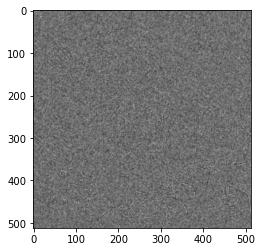

In [ ]:
soustract = img - np.round(blur*255)
plt.imshow(soustract, cmap = 'gray')

**Commentaires**: les pixels affichés représente les valeurs en niveaux de gris ajoutées avec l'ajout du bruit gaussien à l'image.

**3-refaire avec différents masques** 

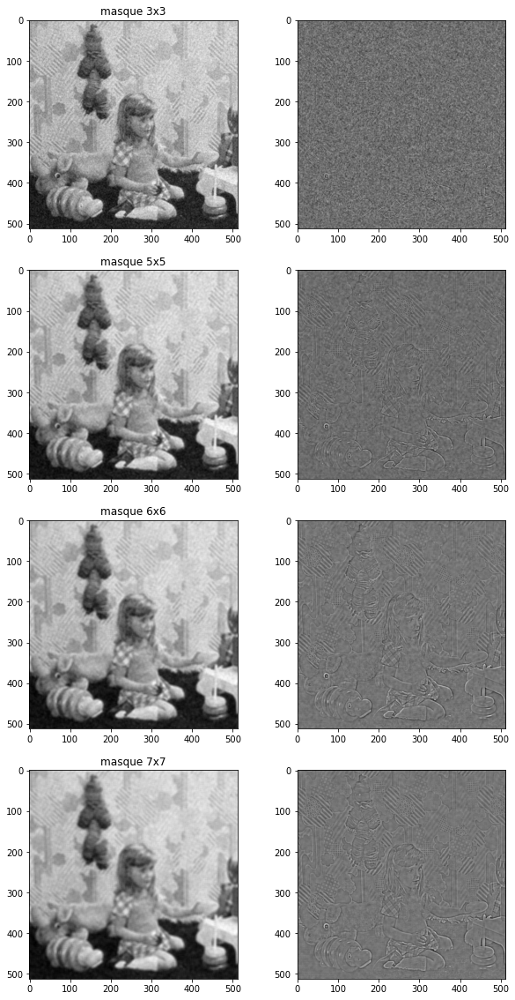

In [ ]:
list = [3,5,6,7]
j=1
plt.figure(figsize=(10,20))
for i in list:
    blur = cv.blur(noisy_img, ksize = (i,i))
    soustract = img - np.round(blur*255)
    plt.subplot(4,2,j)
    plt.title("masque {}x{}".format(i,i))
    plt.imshow(blur, cmap = 'gray')
    j=j+1
    plt.subplot(4,2,j)
    plt.imshow(soustract, cmap='gray')
    j=j+1


**Conclusion:** en augmentant la taille du masque, l'image apparait plus floue et le bruit gaussien ne semble plus présent. quant aux valeurs de niveaux de gris ajoutées ils sont de plus en plus proches de l'image originale

**B-Filtre gaussien**

**1-Réalisation du filtrage gaussien 3x3 sigma=1**

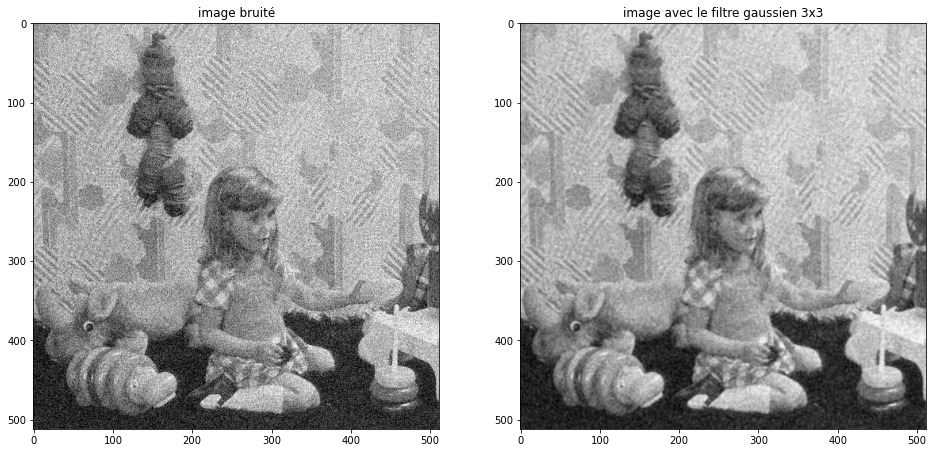

In [ ]:
gaussian_blur = cv.GaussianBlur(noisy_img,ksize=(3,3),sigmaX=1,sigmaY=1)
plt.figure(figsize=(16,20))

plt.subplot(1,2,1)
plt.title("image bruité")
plt.imshow(noisy_img, cmap="gray")
plt.subplot(1,2,2)
plt.title("image avec le filtre gaussien 3x3")
plt.imshow(gaussian_blur, cmap="gray")

**Commentaires**: l'image apparait plus lisse avec moins de contraste

**2-L'étude de l'influence de la taille et de sigma** 

**1. Sigma (ksize=3,3):**

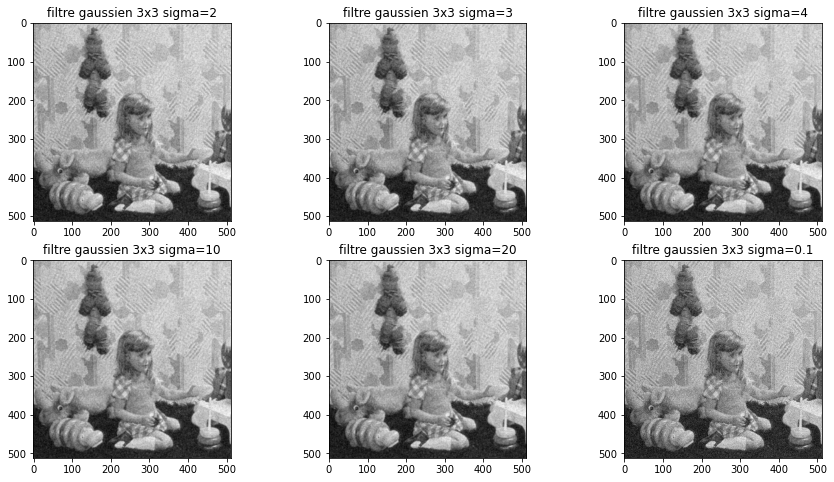

In [ ]:
list_gauss = [2,3,4,10,20,0.1]
j=1
plt.figure(figsize=(15,8))
for i in list_gauss:
    gaussian_blur = cv.GaussianBlur(noisy_img,ksize=(3,3),sigmaX=i,sigmaY=i)
    plt.subplot(2,3,j)
    j=j+1
    plt.title("filtre gaussien 3x3 sigma={}".format(i))
    plt.imshow(gaussian_blur, cmap="gray")


Pour une taille de masque constante avec des valeurs de sigma différentes et superieures à 1, on ne remarque aucune différence. mais pour des valeurs de sigma inférieur à 1 on remarque que le lissage est moins important

**2. taille du masque (sigma = 1)**

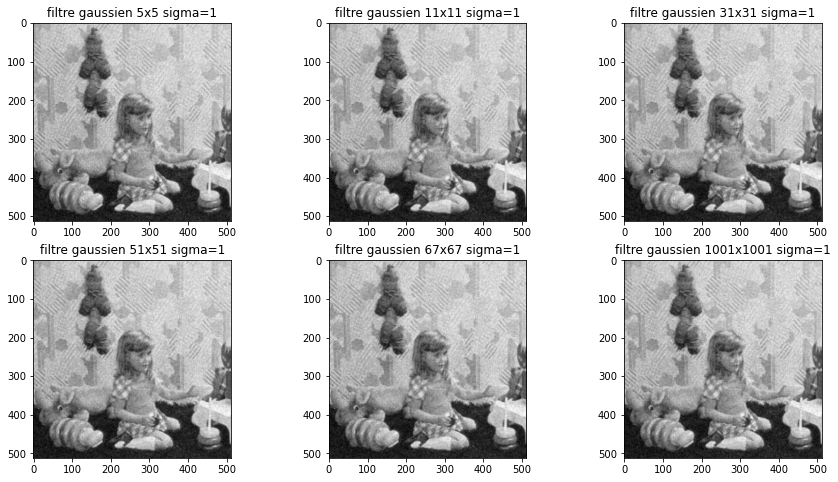

In [ ]:
list_gauss = [5,11,31,51,67,101]
j=1
plt.figure(figsize=(15,8))
for i in list_gauss:
    gaussian_blur = cv.GaussianBlur(noisy_img,ksize=(i,i),sigmaX=1,sigmaY=1)
    plt.subplot(2,3,j)
    j=j+1
    plt.title("filtre gaussien {}x{} sigma=1".format(i,i))
    plt.imshow(gaussian_blur, cmap="gray")

En changeant la taille du masque avec sigma = 1 on remarque que pour certains valeurs le filtrage est meilleur. 

**3-Sélection du meilleur masque**

le meilleur masque est 67x67 pour sigma = 1

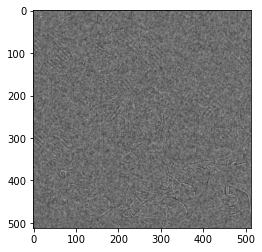

In [ ]:
gaussian_blur = cv.GaussianBlur(noisy_img,ksize=(67,67),sigmaX=1,sigmaY=1)

plt.imshow(img-gaussian_blur*255, cmap='gray')

**Commentaires**: l'image soustraite qui représente les valeurs ajoutées avec le filtre gaussien a des countours a peine visible.

**C-Filtre médian **

In [ ]:
median3 = cv.medianBlur(np.uint8(np.round(noisy_img*255)),3)
median5 = cv.medianBlur(np.uint8(np.round(noisy_img*255)), 5)
median7 = cv.medianBlur(np.uint8(np.round(noisy_img*255)), 7)
median9 = cv.medianBlur(np.uint8(np.round(noisy_img*255)), 9)

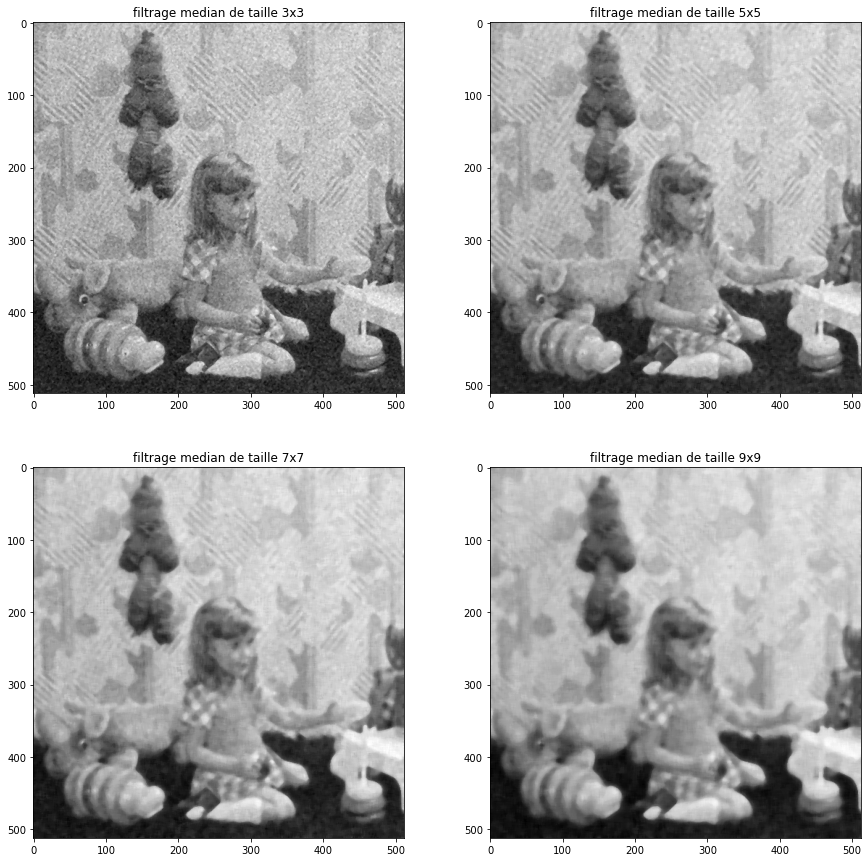

In [ ]:
plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
plt.title("filtrage median de taille 3x3")
plt.imshow(median3,cmap='gray')
plt.subplot(2,2,2)
plt.title("filtrage median de taille 5x5")
plt.imshow(median5,cmap='gray')
plt.subplot(2,2,3)
plt.title("filtrage median de taille 7x7")
plt.imshow(median7,cmap='gray')
plt.subplot(2,2,4)
plt.title("filtrage median de taille 9x9")
plt.imshow(median9,cmap='gray')

Comparez et commentez: plus le filtrage est grand plus le lissage il est important. 

**3-Sélection de la meilleure taille et soustraction** 

la meilleure taille du filtre median est 3x3

In [ ]:
%matplotlib
plt.figure(figsize=(5,5))
plt.title("soustraction entre l'image originale et l'image au filtre median de taille 3x3")
plt.imshow(img-median3,cmap='gray')


Using matplotlib backend: Qt5Agg


**Commentaires :** les valeurs ajoutées avec le filtre sont binaires

**III-Comparaison entre les 3 filtres :** on remarque que le filtre moyenneur et le filtre gaussien ont une logique analogue sauf que le filtre gaussien est plus robuste et accorde plus d'importance au filtre centrale. Quant au filtre median il n'est pas adapté au bruit gaussien.

Le meilleure filtre est celui qui est le plus adapté au bruit gaussien et le filtrage gaussien.

**IV- Refaire l'étude des 3 filtres avec un bruit impulsionnel de 0.1** 

**1. L'ajout du bruit impulsionnel sur l'image** 

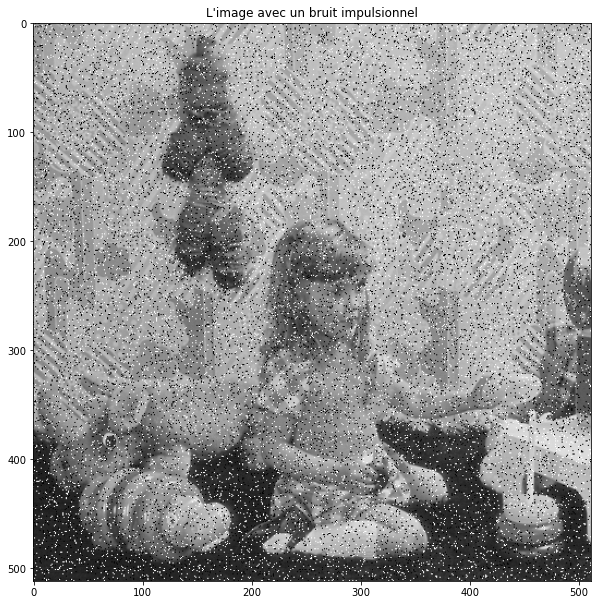

In [ ]:
salted_img = random_noise(img, seed = 1, mode="s&p", amount=0.1)
plt.figure(figsize=(10,16))
plt.title("L'image avec un bruit impulsionnel")
plt.imshow(salted_img, cmap= 'gray')

**2. Application des filtres sur l'image**

**2. 1.  Filtre moyenneur**

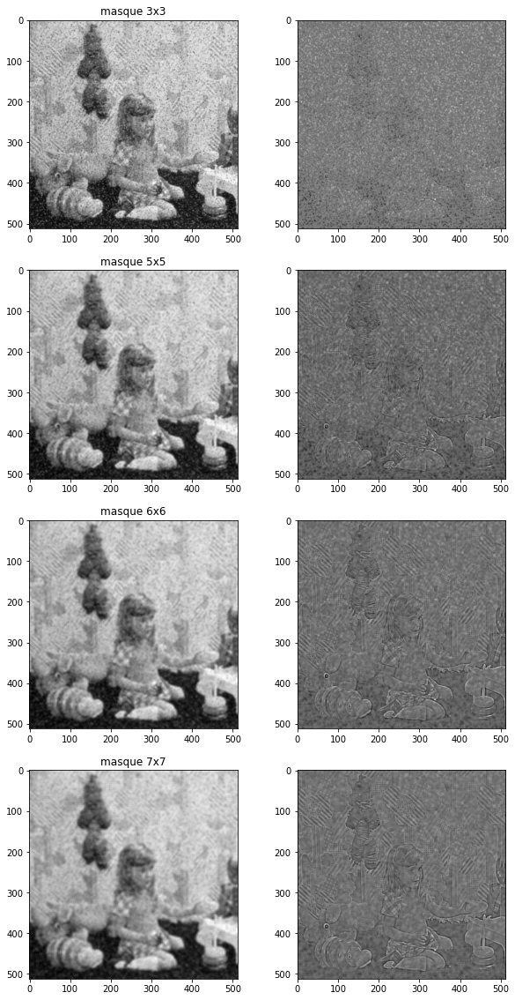

In [ ]:
list = [3,5,6,7]
j=1
plt.figure(figsize=(10,20))
for i in list:
    blur = cv.blur(salted_img, ksize = (i,i))
    soustract = img - np.round(blur*255)
    plt.subplot(4,2,j)
    plt.title("masque {}x{}".format(i,i))
    plt.imshow(blur, cmap = 'gray')
    j=j+1
    plt.subplot(4,2,j)
    plt.imshow(soustract, cmap='gray')
    j=j+1

**2. 2. Filtre gaussien masque de taille 67x67 sigma 1**

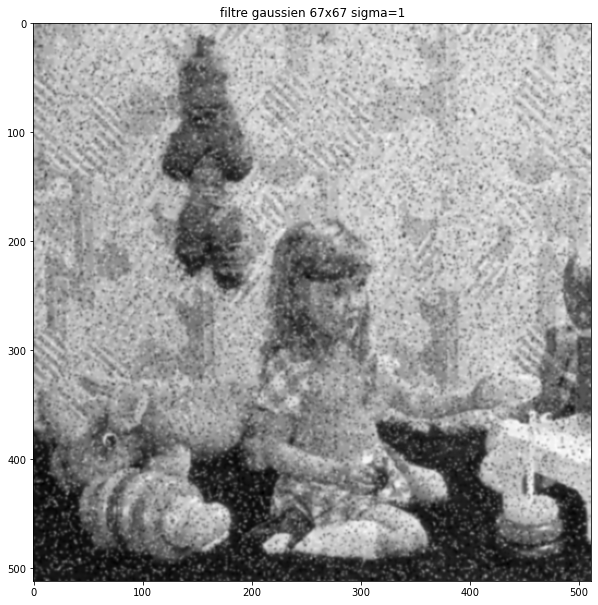

In [ ]:

gaussian_blur = cv.GaussianBlur(salted_img,ksize=(67,67),sigmaX=1,sigmaY=1)

plt.figure(figsize=(10,16))
plt.title("filtre gaussien 67x67 sigma=1")
plt.imshow(gaussian_blur, cmap="gray")


**2. 3. Filtre médian**

In [ ]:

smedian3 = cv.medianBlur(np.uint8(np.round(salted_img*255)),3)

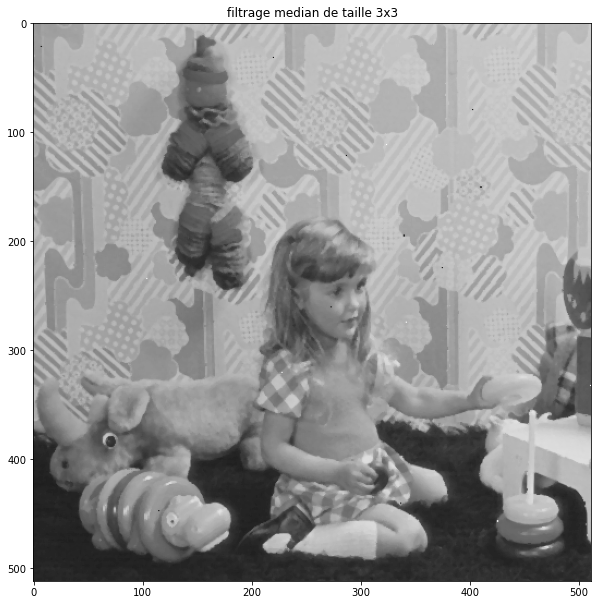

In [ ]:
plt.figure(figsize=(10,15))
plt.title("filtrage median de taille 3x3")
plt.imshow(smedian3, cmap="gray")

**2. 4. le fitragae le plus adapté :** 

In [ ]:
blurmoy3 = cv.blur(salted_img, ksize = (3,3))


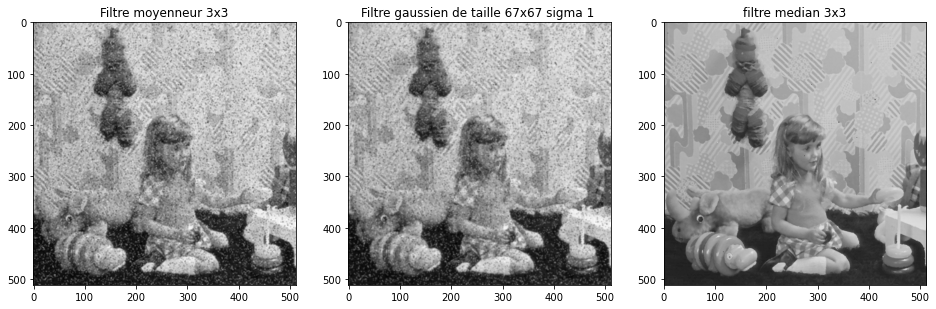

In [ ]:
plt.figure(figsize=(16,10))

plt.subplot(1,3,1)
plt.title("Filtre moyenneur 3x3")
plt.imshow(blurmoy3,cmap="gray")

plt.subplot(1,3,2)
plt.title("Filtre gaussien de taille 67x67 sigma 1 ")
plt.imshow(gaussian_blur,cmap="gray")

plt.subplot(1,3,3)
plt.title("filtre median 3x3")
plt.imshow(smedian3,cmap="gray")



Le filtre le plus adapté pour un bruit impulsionnel est le filtre median.

**V-Reprendre le filtre médian en augmentant le pourcentage des pixels remplacés** 

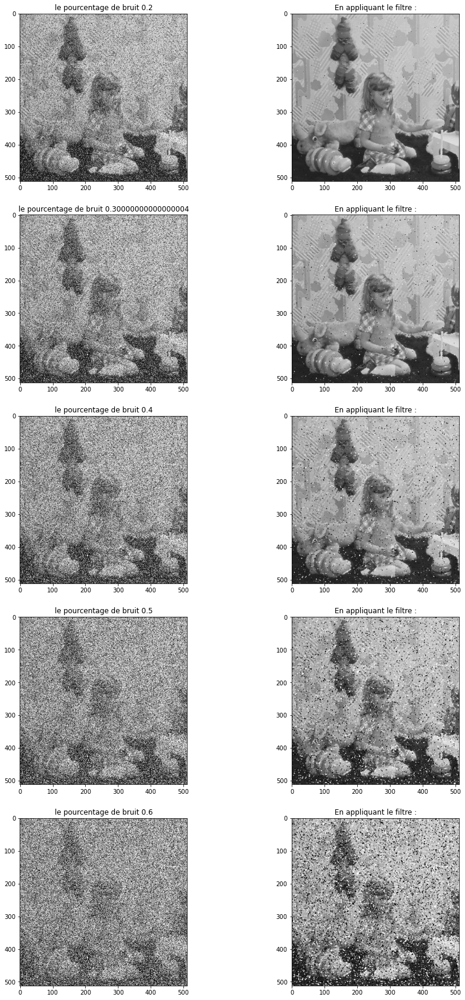

In [ ]:
amount = 0.2
j=2
k=1
plt.figure(figsize=(15,30))
for i in range(1,6):
    
    bruit = random_noise(img, mode= 's&p', seed =1 , amount = amount)
    plt.subplot(5,2,k)
    plt.title("le pourcentage de bruit {}".format(amount))
    plt.imshow(bruit,cmap="gray")
    plt.subplot(5,2,j)
    plt.title("En appliquant le filtre :")
    smedian = cv.medianBlur(np.uint8(np.round(bruit*255)),3)
    plt.imshow(smedian,cmap="gray")
    amount = amount+0.1
    
    j=j+2
    k=k+2




Le filtre reste efficace pour éliminer le bruit impulsionnel jusqu'a arriver a un pourcentage de 0,4 où le pourcentage de bruit restant après l'application du filtre devient considérable.

## **Manipulation 2**

**1. Lecture et affichage de l'image :**

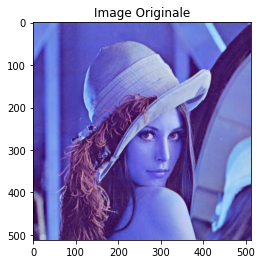

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import cmath as math
import numpy
import random
import os

img2 = cv.imread("/content/lena.png")
plt.imshow(img2)
plt.title("Image Originale")
plt.show()

**2. Transformation en NG :**

(512, 512)


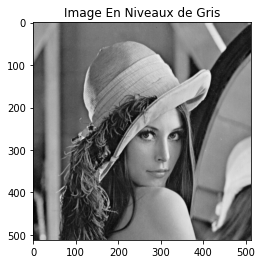

In [ ]:
img=cv.cvtColor(img2,cv.COLOR_BGR2GRAY)
print(img.shape)
plt.imshow(img, cmap='gray')
plt.title("Image En Niveaux de Gris")
plt.show()

**3. Robert :**

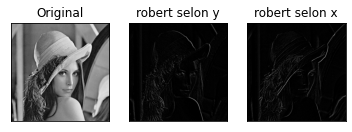

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


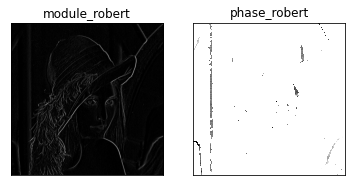

In [ ]:
kernelxr = np.array([[0,-1],[1,0]])
kernelyr = np.array([[1,0],[0,-1]])
robertx = cv.filter2D(img, -1, kernelxr)
roberty = cv.filter2D(img, -1, kernelyr)
plt.subplot(1,3,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2),plt.imshow(robertx,cmap = 'gray')
plt.title('robert selon y'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3),plt.imshow(roberty,cmap = 'gray')
plt.title('robert selon x'), plt.xticks([]), plt.yticks([])
plt.show()

amp_robert_carre=np.square(robertx.astype(np.float32))+np.square(roberty.astype(np.float32))
amp_robert=np.sqrt(amp_robert_carre)
amp_robert=np.uint8(amp_robert)
phase_robert=np.arctan(roberty/robertx)
plt.subplot(1,2,1),plt.imshow(amp_robert,cmap = 'gray')
plt.title('module_robert'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(phase_robert,cmap = 'gray')
plt.title('phase_robert'), plt.xticks([]), plt.yticks([])
plt.show()

**3. Prewitt :**

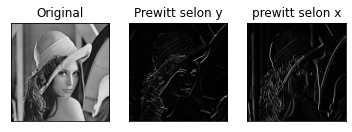

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


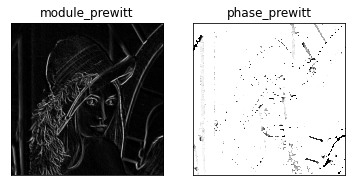

In [ ]:
kernelx = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
kernely = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
prewittx = cv.filter2D(img, -1, kernelx)
prewitty = cv.filter2D(img, -1, kernely)
plt.subplot(1,3,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2),plt.imshow(prewittx,cmap = 'gray')
plt.title('Prewitt selon y'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3),plt.imshow(prewitty,cmap = 'gray')
plt.title('prewitt selon x'), plt.xticks([]), plt.yticks([])
plt.show()

amp_prewitt_carre=np.square(prewittx.astype(np.float32))+np.square(prewitty.astype(np.float32))
amp_prewitt=np.sqrt(amp_prewitt_carre)
amp_prewitt=np.uint8(amp_prewitt)
phase_prewitt=np.arctan(prewitty/prewittx)
plt.subplot(1,2,1),plt.imshow(amp_prewitt,cmap = 'gray')
plt.title('module_prewitt'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(phase_prewitt,cmap = 'gray')
plt.title('phase_prewitt'), plt.xticks([]), plt.yticks([])
plt.show()

**3. Sobel:**

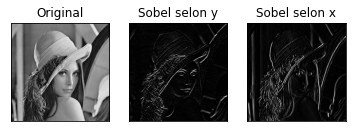

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in true_divide
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


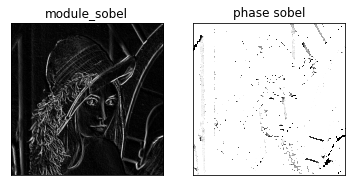

In [ ]:
kernelxs = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])
kernelys = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
sobelx = cv.filter2D(img, -1, kernelxs)
sobely = cv.filter2D(img, -1, kernelys)

plt.subplot(1,3,1),plt.imshow(img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel selon y'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel selon x'), plt.xticks([]), plt.yticks([])
plt.show()
amp_sobel_carre=np.square(sobelx.astype(np.float32))+np.square(sobely.astype(np.float32))
amp_sobel=np.sqrt(amp_sobel_carre)
amp_sobel=np.uint8(amp_sobel)
phase_sobel=np.arctan(sobely/sobelx)
plt.subplot(1,2,1),plt.imshow(amp_sobel,cmap = 'gray')
plt.title('module_sobel'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(phase_sobel,cmap = 'gray')
plt.title('phase sobel'), plt.xticks([]), plt.yticks([])
plt.show()

**Comparaison :** 

Le filtre Sobel rend les contours plus solides que le filtre Prewitt qui les rend plus solides que le filtre Roberts.

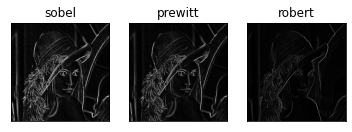

In [ ]:
plt.subplot(1,3,1),plt.imshow(amp_sobel,cmap = 'gray')
plt.title('sobel'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,2),plt.imshow(amp_prewitt,cmap = 'gray')
plt.title('prewitt'), plt.xticks([]), plt.yticks([])
plt.subplot(1,3,3),plt.imshow(amp_robert,cmap = 'gray')
plt.title('robert'), plt.xticks([]), plt.yticks([])
plt.show()

**4. Laplacien 4 et 8 connexités:**

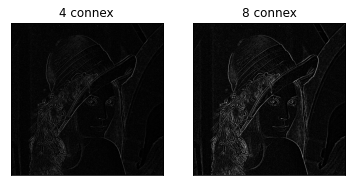

In [ ]:
kernel4 = np.array([[0,1,0],[1,-4,1],[0,1,0]])
laplacien4connex = cv.filter2D(img, -1, kernel4)
kernel8 = np.array([[1,1,1],[1,-8,1],[1,1,1]])
laplacien8connex = cv.filter2D(img, -1, kernel8)

plt.subplot(1,2,1),plt.imshow(laplacien4connex,cmap = 'gray')
plt.title('4 connex'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(laplacien8connex,cmap = 'gray')
plt.title('8 connex'), plt.xticks([]), plt.yticks([])
plt.show()

Comparaison : 

- Le Laplacien 8 connexités définit mieuc les contours.
- Par contre, e Laplacien 4 connexités rajoute moins de bruit.

**5. Appliquer un filtrage gaussien avant de calculer le Laplacien 8-connexité :**

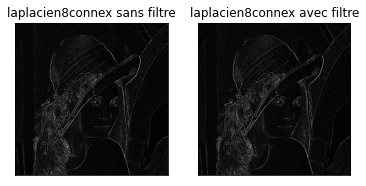

In [ ]:
blur_gauss = cv.GaussianBlur(img,(3,3),1)
laplacien_gauss_8connex = cv.filter2D(img, -1, kernel8)
plt.subplot(1,2,1),plt.imshow(laplacien8connex,cmap = 'gray')
plt.title('laplacien8connex sans filtre'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(laplacien_gauss_8connex,cmap = 'gray')
plt.title('laplacien8connex avec filtre'), plt.xticks([]), plt.yticks([])
plt.show()

**6. Amélioration du Laplacien par seuillage :**

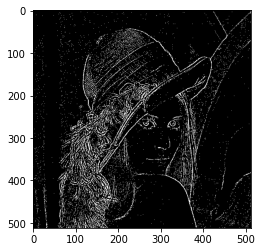

In [ ]:
th = 0
ret, Lap_blur_th = cv.threshold(laplacien8connex, th, 255, cv.THRESH_OTSU )
plt.imshow(Lap_blur_th, cmap="gray")

**7. Comparaison entre les différents filtres appliqués pour la détection de contours :**

- Sobel > Prewitt > Roberts : en terme de solidité des contours.
- Le Laplacien 8 connexités définit mieux les contours que le Laplacien 4 connexités, mais rajoute plus de bruit.
- L'application du Laplacien à l'image filtré est préférable, mais donne des contours flous, et pour régler cela, on doit appliquer un seuillage pour améliorer les resultats du Laplacien.

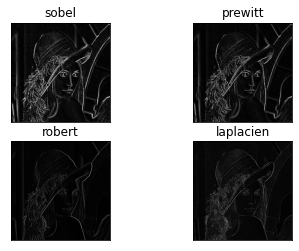

In [ ]:
plt.subplot(2,2,1),plt.imshow(amp_sobel,cmap = 'gray')
plt.title('sobel'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(amp_prewitt,cmap = 'gray')
plt.title('prewitt'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(amp_robert,cmap = 'gray')
plt.title('robert'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(laplacien_gauss_8connex,cmap = 'gray')
plt.title('laplacien'), plt.xticks([]), plt.yticks([])
plt.show()

# **Partie II: Filtrage fréquentiel**

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage.util import random_noise

**1-Lecture et affichage de l'image** 

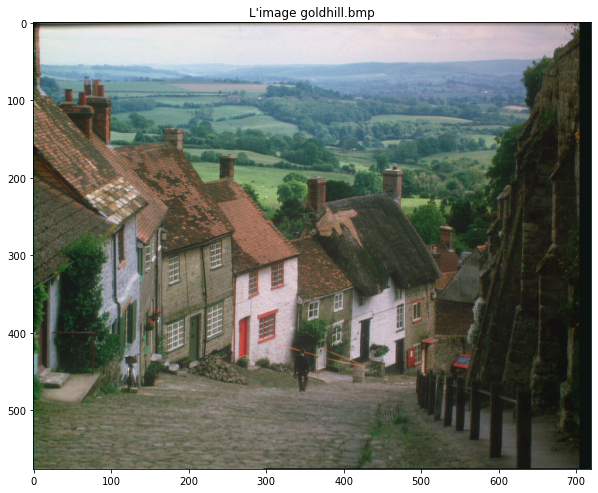

In [ ]:
imgg = cv.imread("C:/Users/User/Documents/Etudes/TIM/images/goldhill.bmp")
imgg = cv.cvtColor(imgg, cv.COLOR_BGR2RGB)
plt.figure(figsize=(10,16))
plt.title("L'image goldhill.bmp")
plt.imshow(imgg)

In [ ]:
imgg.shape

(576, 720, 3)

**2-Transformation de l'image en niveaux de gris** 

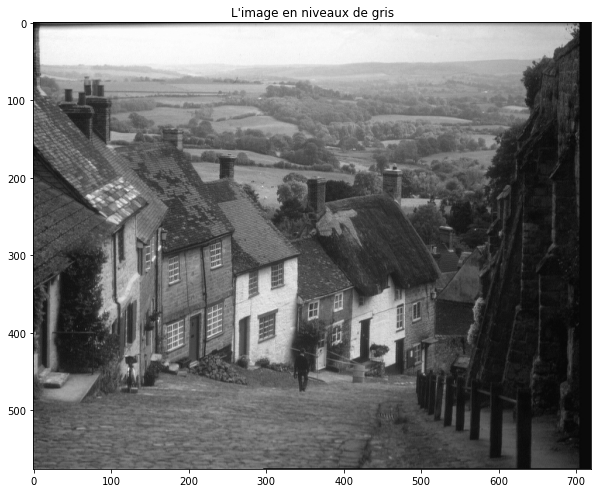

In [ ]:
gris = cv.cvtColor(imgg, cv.COLOR_BGR2GRAY)
plt.figure(figsize=(10,16))
plt.title("L'image en niveaux de gris")
plt.imshow(gris, cmap = 'gray')

**3-Ajout du bruit gaussien à l'image** 

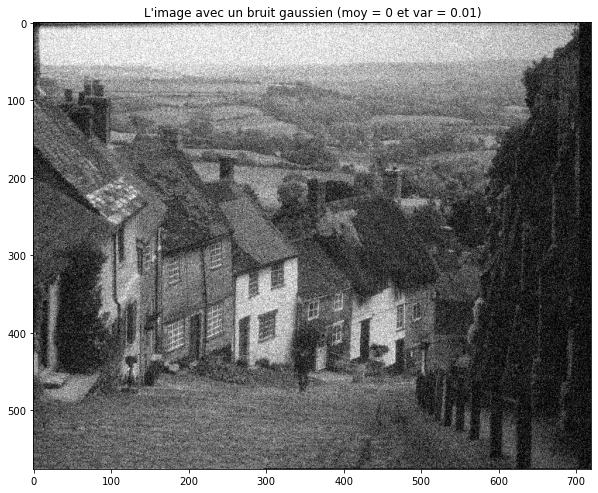

In [ ]:
noisy_imgg = (random_noise(gris, mode = 'gaussian', var = 0.01, mean = 0 )*255).astype(np.uint8)
plt.figure(figsize=(10,16))
plt.title("L'image avec un bruit gaussien (moy = 0 et var = 0.01)")
plt.imshow(noisy_imgg, cmap='gray')


**4- Calcul de la transformé de Fourier discrète de l'image**

In [ ]:
f = np.fft.fft2(noisy_imgg)
fshift = np.fft.fftshift(f)


**5-Affichage du spectre de l'image**

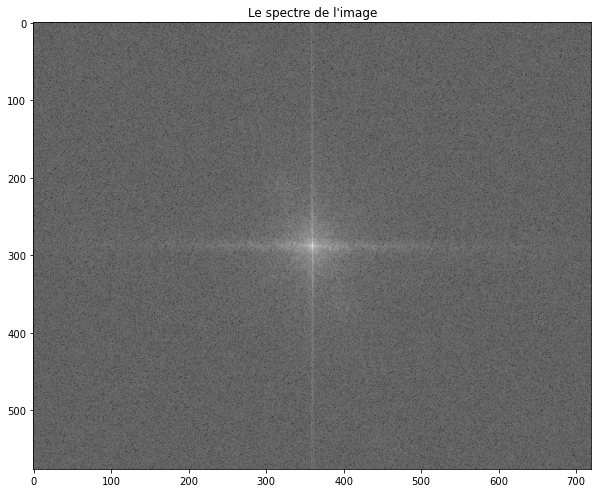

In [ ]:
magnitude_spectrum = 20*np.log(np.abs(fshift))
plt.figure(figsize=(10,16))
plt.title("Le spectre de l'image")
plt.imshow(magnitude_spectrum,cmap='gray')

**6- Génération et affichage de la fonction de transfert du filtre H** 

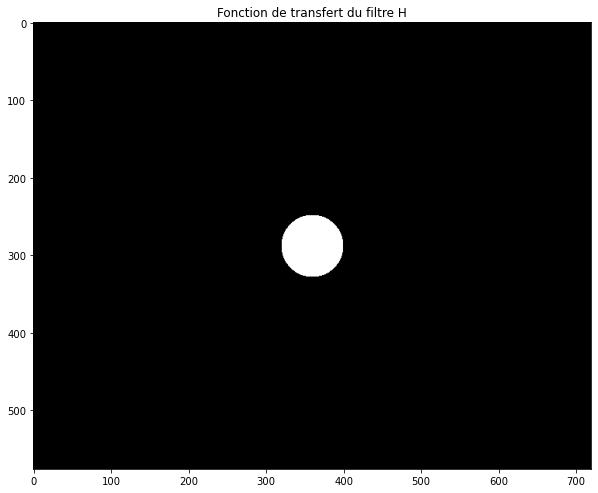

In [ ]:
nl,nc=noisy_imgg.shape
D0=40 #D0 fréquence de coupure du filtre
x = np.arange(-nl/2,nl/2,1)
y = np.arange(-nc/2, nc/2, 1)
xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx*xx+yy*yy)
H=z<D0
plt.figure(figsize=(10,16))
plt.title('Fonction de transfert du filtre H')
plt.imshow(H,cmap='gray')
plt.show()

**7-Multiplication du spectre de l'image par la fonction de trasfert H, et affichage du résultat**

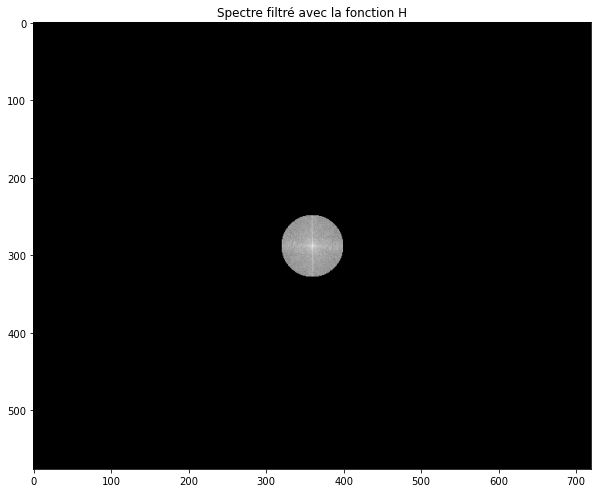

In [ ]:
spectre_filtre_H = H*magnitude_spectrum
plt.figure(figsize=(10,16))
plt.title("Spectre filtré avec la fonction H")
plt.imshow(spectre_filtre_H,cmap="gray")

**8- Réalisation de la transformée de Fourier inverse** 

In [ ]:
f_ishift = np.fft.ifftshift(fshift)

**9-Affichage de l'image filtrée** 

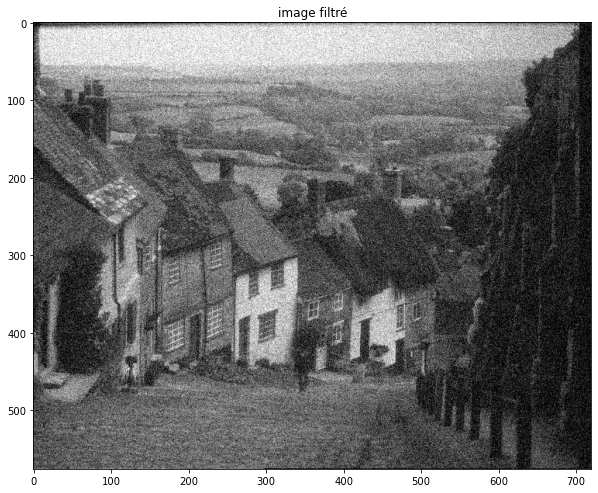

In [ ]:
img_back = np.fft.ifft2(f_ishift)
img_back=np.absolute(img_back)
img_back = np.uint8(img_back)
plt.figure(figsize=(10,16))
plt.title("image filtré")
plt.imshow(img_back,cmap='gray')

**Passe haut**

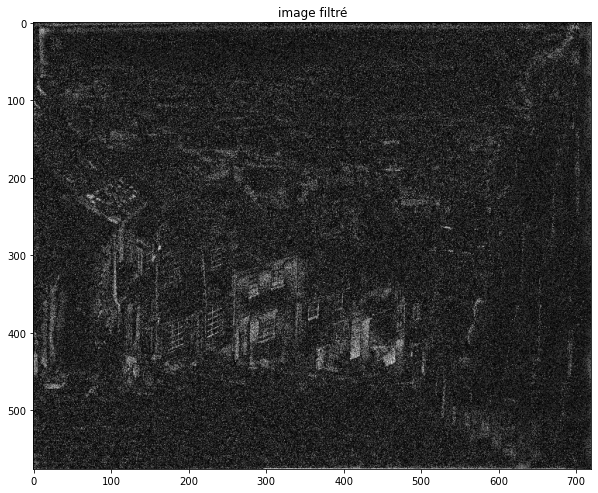

In [ ]:
nl,nc=noisy_imgg.shape
D0=15 #D0 fréquence de coupure du filtre
x = np.arange(-nl/2,nl/2,1)
y = np.arange(-nc/2, nc/2, 1)

xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx*xx+yy*yy)
H=z>D0

spectre_filtre_H = H*magnitude_spectrum

f_ishift = np.fft.ifftshift(fshift*H)
img_back = np.fft.ifft2(f_ishift)
img_back = np.absolute(img_back)
img_back=np.uint8(img_back)
plt.figure(figsize=(10,16))
plt.title("image filtré")
plt.imshow(img_back,cmap='gray')


**Passe-bande :** 

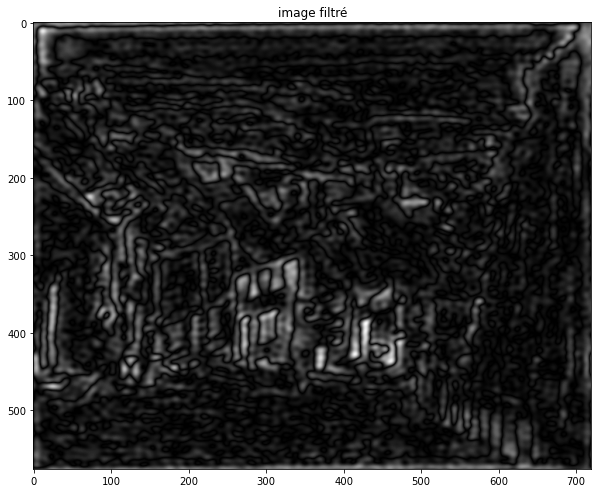

In [ ]:
nl,nc=noisy_imgg.shape
D0=10 #D0 fréquence de coupure du filtre
D1=60
x = np.arange(-nl/2,nl/2,1)
y = np.arange(-nc/2, nc/2, 1)

xx, yy = np.meshgrid(y, x, sparse=True)
z = np.sqrt(xx*xx+yy*yy)

H1= z>D0
H2= z<D1
H= H1*H2

spectre_filtre_H = H*magnitude_spectrum

f_ishift = np.fft.ifftshift(fshift*H)
img_back = np.fft.ifft2(f_ishift)
img_back = np.absolute(img_back)
img_back=np.uint8(img_back)
plt.figure(figsize=(10,16))
plt.title("image filtré")
plt.imshow(img_back,cmap='gray')


**12-Conclusion :** le filtrage fréquentiel passe bas a pour but de d'éliminer les hautes fréquences et de laisser que les fréquence au dessous du seuil. par contre le filtrage passe haut laisse que les fréquences supérieures au seuil. et enfin le filtre passe bande laisse les fréquences qui sont compris entre deux fréquences limites. 